In [6]:
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from PIL import Image
from collections import Counter, defaultdict
from pathlib import Path
import warnings
warnings.filterwarnings('ignore')

sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = (14, 6)
plt.rcParams['font.size'] = 12

# Class mapping
CLASS_NAMES = {
    0: 'Pedestrian', 1: 'People', 2: 'Bicycle', 3: 'Car',
    4: 'Van', 5: 'Truck', 6: 'Tricycle', 7: 'Awning-tricycle',
    8: 'Bus', 9: 'Motor'
}

# Target classes for this task
TARGET_CLASSES = {0: 'Pedestrian', 1: 'People', 3: 'Car'}
HUMAN_CLASSES = {0, 1}
CAR_CLASSES = {3}

BASE = '/kaggle/input/datasets/banuprasadb/visdrone-dataset/VisDrone_Dataset'
SPLITS = {
    'train': f'{BASE}/VisDrone2019-DET-train',
    'val':   f'{BASE}/VisDrone2019-DET-val',
    'test':  f'{BASE}/VisDrone2019-DET-test-dev',
}

print("✅ Setup complete")
print(f"Classes: {CLASS_NAMES}")
print(f"Target classes: {TARGET_CLASSES}")

✅ Setup complete
Classes: {0: 'Pedestrian', 1: 'People', 2: 'Bicycle', 3: 'Car', 4: 'Van', 5: 'Truck', 6: 'Tricycle', 7: 'Awning-tricycle', 8: 'Bus', 9: 'Motor'}
Target classes: {0: 'Pedestrian', 1: 'People', 3: 'Car'}


In [7]:
for split_name, split_path in SPLITS.items():
    img_dir = os.path.join(split_path, 'images')
    lbl_dir = os.path.join(split_path, 'labels')

    imgs = glob.glob(os.path.join(img_dir, '*.jpg'))
    lbls = glob.glob(os.path.join(lbl_dir, '*.txt'))

    # Check for images without labels and vice versa
    img_stems = {Path(f).stem for f in imgs}
    lbl_stems = {Path(f).stem for f in lbls}

    imgs_no_lbl = img_stems - lbl_stems
    lbls_no_img = lbl_stems - img_stems

    print(f"\n📁 {split_name.upper()}")
    print(f"   Images: {len(imgs)}")
    print(f"   Labels: {len(lbls)}")
    print(f"   Images WITHOUT labels: {len(imgs_no_lbl)}")
    print(f"   Labels WITHOUT images: {len(lbls_no_img)}")
    if imgs_no_lbl:
        print(f"   ⚠️  Missing label examples: {list(imgs_no_lbl)[:5]}")

# Check challenge set
challenge_path = f'{BASE}/VisDrone2019-DET-test-challenge/images'
if os.path.exists(challenge_path):
    ch_imgs = glob.glob(os.path.join(challenge_path, '*.jpg'))
    print(f"\n📁 TEST-CHALLENGE")
    print(f"   Images: {len(ch_imgs)} (no labels - challenge set)")


📁 TRAIN
   Images: 6471
   Labels: 6471
   Images WITHOUT labels: 0
   Labels WITHOUT images: 0

📁 VAL
   Images: 548
   Labels: 548
   Images WITHOUT labels: 0
   Labels WITHOUT images: 0

📁 TEST
   Images: 1610
   Labels: 1610
   Images WITHOUT labels: 0
   Labels WITHOUT images: 0

📁 TEST-CHALLENGE
   Images: 1580 (no labels - challenge set)


In [8]:
def parse_yolo_labels(split_name, split_path):
    """Parse YOLO format labels into a list of dicts."""
    lbl_dir = os.path.join(split_path, 'labels')
    img_dir = os.path.join(split_path, 'images')
    records = []

    for lbl_file in glob.glob(os.path.join(lbl_dir, '*.txt')):
        stem = Path(lbl_file).stem
        img_file = os.path.join(img_dir, f'{stem}.jpg')

        with open(lbl_file, 'r') as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            cls_id = int(parts[0])
            x_center, y_center, w, h = map(float, parts[1:5])
            records.append({
                'split': split_name,
                'image': stem,
                'img_path': img_file,
                'class_id': cls_id,
                'class_name': CLASS_NAMES.get(cls_id, f'unknown_{cls_id}'),
                'x_center': x_center,
                'y_center': y_center,
                'bbox_w': w,
                'bbox_h': h,
                'bbox_area': w * h,  # normalized area
            })
    return records

all_records = []
for split_name, split_path in SPLITS.items():
    print(f"Parsing {split_name}...")
    recs = parse_yolo_labels(split_name, split_path)
    all_records.extend(recs)
    print(f"  → {len(recs)} annotations")

df = pd.DataFrame(all_records)
print(f"\n✅ Total annotations: {len(df)}")
print(f"Total unique images with annotations: {df['image'].nunique()}")
print(f"\nDataFrame shape: {df.shape}")
df.head(10)

Parsing train...
  → 343205 annotations
Parsing val...
  → 38759 annotations
Parsing test...
  → 75102 annotations

✅ Total annotations: 457066
Total unique images with annotations: 8629

DataFrame shape: (457066, 10)


,split,image,img_path,class_id,class_name,x_center,y_center,bbox_w,bbox_h,bbox_area
0,train,0000325_04801_d_0000686,/kaggle/input/datasets/banuprasadb/visdrone-da...,3,Car,0.081250,0.350327,0.038971,0.047059,0.001834
1,train,0000325_04801_d_0000686,/kaggle/input/datasets/banuprasadb/visdrone-da...,5,Truck,0.220221,0.256209,0.030147,0.078431,0.002364
2,train,0000325_04801_d_0000686,/kaggle/input/datasets/banuprasadb/visdrone-da...,0,Pedestrian,0.352941,0.319608,0.011765,0.035294,0.000415
3,train,0000325_04801_d_0000686,/kaggle/input/datasets/banuprasadb/visdrone-da...,5,Truck,0.328309,0.780392,0.071324,0.235294,0.016782
4,train,0000325_04801_d_0000686,/kaggle/input/datasets/banuprasadb/visdrone-da...,3,Car,0.430147,0.685621,0.035294,0.092810,0.003276
5,train,0000325_04801_d_0000686,/kaggle/input/datasets/banuprasadb/visdrone-da...,3,Car,0.512132,0.862745,0.040441,0.125490,0.005075
6,train,0000325_04801_d_0000686,/kaggle/input/datasets/banuprasadb/visdrone-da...,3,Car,0.548897,0.687582,0.037500,0.086275,0.003235
7,train,0000325_04801_d_0000686,/kaggle/input/datasets/banuprasadb/visdrone-da...,4,Van,0.534559,0.558824,0.032353,0.079739,0.002580
8,train,0000325_04801_d_0000686,/kaggle/input/datasets/banuprasadb/visdrone-da...,3,Car,0.539706,0.469281,0.029412,0.057516,0.001692
9,train,0000325_04801_d_0000686,/kaggle/input/datasets/banuprasadb/visdrone-da...,3,Car,0.578676,0.583660,0.032353,0.071895,0.002326


# **Image Resolution Analysis**


📐 IMAGE RESOLUTION SUMMARY

TRAIN:
  Unique resolutions: 11
  Width  — min: 480, max: 2000, mean: 1520
  Height — min: 360, max: 1500, mean: 1002
  Megapixels — min: 0.17, max: 3.00

VAL:
  Unique resolutions: 3
  Width  — min: 960, max: 1920, mean: 1291
  Height — min: 540, max: 1080, mean: 726
  Megapixels — min: 0.52, max: 2.07

TEST:
  Unique resolutions: 6
  Width  — min: 960, max: 1920, mean: 1442
  Height — min: 540, max: 1080, mean: 856
  Megapixels — min: 0.52, max: 2.07


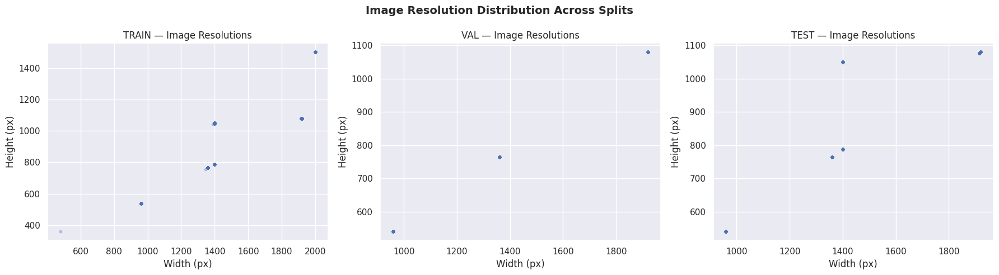


📊 Top 10 Most Common Resolutions (all splits):
width  height
1400   1050      2772
       788       2232
1360   765       1318
2000   1500       772
1916   1078       688
960    540        420
1920   1080       394
1398   1048        30
480    360          1
1344   756          1
dtype: int64


In [17]:
res_records = []
for split_name, split_path in SPLITS.items():
    img_dir = os.path.join(split_path, 'images')
    img_files = glob.glob(os.path.join(img_dir, '*.jpg'))

    for img_file in img_files:
        try:
            with Image.open(img_file) as img:
                w, h = img.size
            res_records.append({
                'split': split_name,
                'image': Path(img_file).stem,
                'width': w,
                'height': h,
                'aspect_ratio': w / h,
                'megapixels': (w * h) / 1e6
            })
        except Exception as e:
            print(f"  ⚠️ Error reading {img_file}: {e}")

res_df = pd.DataFrame(res_records)

print("\n📐 IMAGE RESOLUTION SUMMARY")
print("=" * 50)
for split in ['train', 'val', 'test']:
    subset = res_df[res_df['split'] == split]
    print(f"\n{split.upper()}:")
    print(f"  Unique resolutions: {subset[['width','height']].drop_duplicates().shape[0]}")
    print(f"  Width  — min: {subset['width'].min()}, max: {subset['width'].max()}, mean: {subset['width'].mean():.0f}")
    print(f"  Height — min: {subset['height'].min()}, max: {subset['height'].max()}, mean: {subset['height'].mean():.0f}")
    print(f"  Megapixels — min: {subset['megapixels'].min():.2f}, max: {subset['megapixels'].max():.2f}")

# Resolution distribution plot
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, split in enumerate(['train', 'val', 'test']):
    subset = res_df[res_df['split'] == split]
    axes[i].scatter(subset['width'], subset['height'], alpha=0.3, s=10)
    axes[i].set_title(f'{split.upper()} — Image Resolutions')
    axes[i].set_xlabel('Width (px)')
    axes[i].set_ylabel('Height (px)')
fig.suptitle('Image Resolution Distribution Across Splits', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Most common resolutions
print("\n📊 Top 10 Most Common Resolutions (all splits):")
print(res_df.groupby(['width', 'height']).size().sort_values(ascending=False).head(10))


# **Class Distribution Analysis**


Overall annotation counts:
class_name
Awning-tricycle      4377
Bicycle             13069
Bus                  9117
Car                187005
Motor               40378
Pedestrian         109187
People              38560
Tricycle             6387
Truck               16284
Van                 32702

Total: 457066


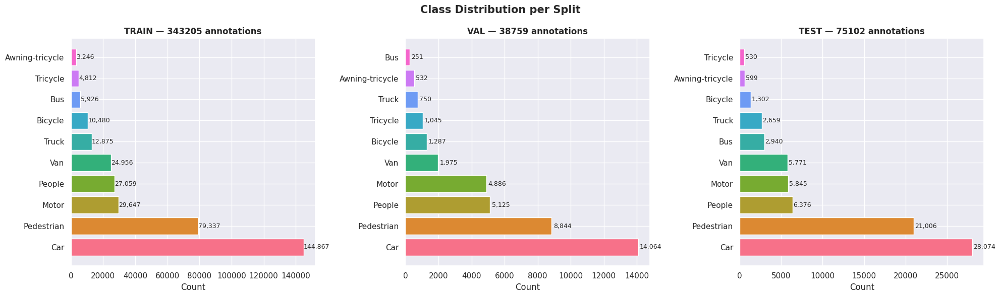


📊 CLASS PERCENTAGE BREAKDOWN:

TRAIN:
  Car                 :  42.21% ← TARGET
  Pedestrian          :  23.12% ← TARGET
  Motor               :   8.64%
  People              :   7.88% ← TARGET
  Van                 :   7.27%
  Truck               :   3.75%
  Bicycle             :   3.05%
  Bus                 :   1.73%
  Tricycle            :   1.40%
  Awning-tricycle     :   0.95%

VAL:
  Car                 :  36.29% ← TARGET
  Pedestrian          :  22.82% ← TARGET
  People              :  13.22% ← TARGET
  Motor               :  12.61%
  Van                 :   5.10%
  Bicycle             :   3.32%
  Tricycle            :   2.70%
  Truck               :   1.94%
  Awning-tricycle     :   1.37%
  Bus                 :   0.65%

TEST:
  Car                 :  37.38% ← TARGET
  Pedestrian          :  27.97% ← TARGET
  People              :   8.49% ← TARGET
  Motor               :   7.78%
  Van                 :   7.68%
  Bus                 :   3.91%
  Truck               :   3.54%
  B

In [9]:
# Overall counts
class_counts = df['class_name'].value_counts().sort_index()
print("\nOverall annotation counts:")
print(class_counts.to_string())
print(f"\nTotal: {len(df)}")

# Per-split class distribution
fig, axes = plt.subplots(1, 3, figsize=(20, 6))
colors = sns.color_palette("husl", 10)

for i, split in enumerate(['train', 'val', 'test']):
    subset = df[df['split'] == split]
    counts = subset['class_name'].value_counts()
    bars = axes[i].barh(counts.index, counts.values, color=colors[:len(counts)])
    axes[i].set_title(f'{split.upper()} — {len(subset)} annotations', fontweight='bold')
    axes[i].set_xlabel('Count')
    for bar, val in zip(bars, counts.values):
        axes[i].text(bar.get_width() + 100, bar.get_y() + bar.get_height()/2,
                     f'{val:,}', va='center', fontsize=9)

fig.suptitle('Class Distribution per Split', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

# Class percentage breakdown
print("\n📊 CLASS PERCENTAGE BREAKDOWN:")
for split in ['train', 'val', 'test']:
    subset = df[df['split'] == split]
    pcts = (subset['class_name'].value_counts(normalize=True) * 100).round(2)
    print(f"\n{split.upper()}:")
    for cls, pct in pcts.items():
        marker = " ← TARGET" if cls in ['Pedestrian', 'People', 'Car'] else ""
        print(f"  {cls:20s}: {pct:6.2f}%{marker}")


# **TARGET CLASS ANALYSIS (Human & Car)**


TRAIN:
  Target annotations:     251,263 (73.2%)
  Non-target annotations:  91,942 (26.8%)
  Humans (Ped+People):    106,396
  Cars:                   144,867

VAL:
  Target annotations:      28,033 (72.3%)
  Non-target annotations:  10,726 (27.7%)
  Humans (Ped+People):     13,969
  Cars:                    14,064

TEST:
  Target annotations:      55,456 (73.8%)
  Non-target annotations:  19,646 (26.2%)
  Humans (Ped+People):     27,382
  Cars:                    28,074


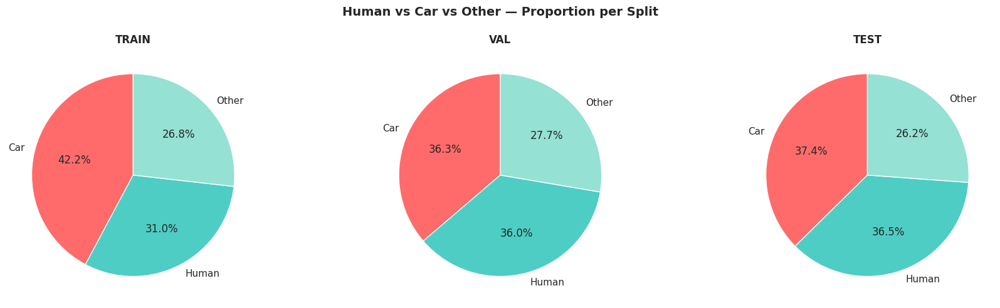


PEDESTRIAN vs PEOPLE BREAKDOWN:
  TRAIN: Pedestrian=79,337 (74.6%), People=27,059 (25.4%)
  VAL: Pedestrian=8,844 (63.3%), People=5,125 (36.7%)
  TEST: Pedestrian=21,006 (76.7%), People=6,376 (23.3%)


In [10]:
df['is_target'] = df['class_id'].isin([0, 1, 3])
df['target_group'] = df['class_id'].map(
    lambda x: 'Human' if x in HUMAN_CLASSES else ('Car' if x in CAR_CLASSES else 'Other')
)

# Target vs Non-target split
for split in ['train', 'val', 'test']:
    subset = df[df['split'] == split]
    target = subset[subset['is_target']]
    non_target = subset[~subset['is_target']]
    print(f"\n{split.upper()}:")
    print(f"  Target annotations:     {len(target):>7,} ({len(target)/len(subset)*100:.1f}%)")
    print(f"  Non-target annotations: {len(non_target):>7,} ({len(non_target)/len(subset)*100:.1f}%)")

    # Human vs Car breakdown
    humans = target[target['target_group'] == 'Human']
    cars = target[target['target_group'] == 'Car']
    print(f"  Humans (Ped+People):    {len(humans):>7,}")
    print(f"  Cars:                   {len(cars):>7,}")

# Pie chart for target class proportions
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, split in enumerate(['train', 'val', 'test']):
    subset = df[df['split'] == split]
    group_counts = subset['target_group'].value_counts()
    axes[i].pie(group_counts, labels=group_counts.index, autopct='%1.1f%%',
                colors=['#FF6B6B', '#4ECDC4', '#95E1D3'], startangle=90)
    axes[i].set_title(f'{split.upper()}', fontweight='bold')
fig.suptitle('Human vs Car vs Other — Proportion per Split', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Pedestrian vs People breakdown
print("\nPEDESTRIAN vs PEOPLE BREAKDOWN:")
for split in ['train', 'val', 'test']:
    subset = df[(df['split'] == split) & (df['class_id'].isin([0, 1]))]
    ped = (subset['class_id'] == 0).sum()
    ppl = (subset['class_id'] == 1).sum()
    total = ped + ppl
    if total > 0:
        print(f"  {split.upper()}: Pedestrian={ped:,} ({ped/total*100:.1f}%), People={ppl:,} ({ppl/total*100:.1f}%)")

# **OBJECTS PER IMAGE ANALYSIS**

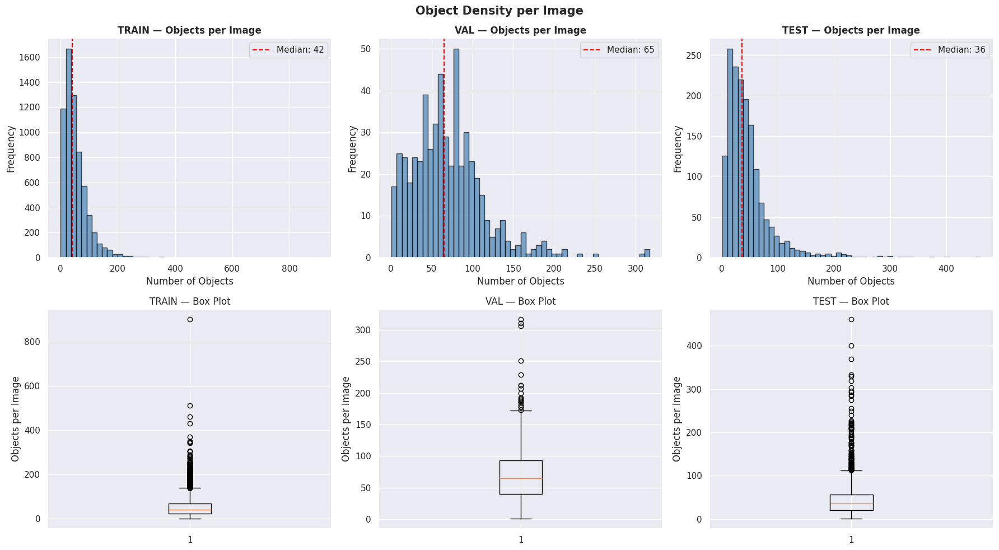


Detailed stats:

TRAIN:
  Min: 1, Max: 902
  Mean: 53.0, Median: 42
  Std: 43.8
  Images with >100 objects: 703
  Images with >200 objects: 80

VAL:
  Min: 1, Max: 317
  Mean: 70.7, Median: 65
  Std: 46.0
  Images with >100 objects: 107
  Images with >200 objects: 8

TEST:
  Min: 1, Max: 461
  Mean: 46.6, Median: 36
  Std: 44.1
  Images with >100 objects: 127
  Images with >200 objects: 29

🎯 TARGET OBJECTS (Human+Car) per image:
  TRAIN: Mean=38.8, Max=896
  VAL: Mean=51.2, Max=264
  TEST: Mean=34.6, Max=435

HUMANS per image:
  TRAIN: Mean=18.7, Max=888, Images with humans=5684
  VAL: Mean=26.3, Max=175, Images with humans=531
  TEST: Mean=21.6, Max=376, Images with humans=1267


In [11]:
obj_per_img = df.groupby(['split', 'image']).size().reset_index(name='num_objects')

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

for i, split in enumerate(['train', 'val', 'test']):
    subset = obj_per_img[obj_per_img['split'] == split]

    # Histogram
    axes[0][i].hist(subset['num_objects'], bins=50, color='steelblue', edgecolor='black', alpha=0.7)
    axes[0][i].set_title(f'{split.upper()} — Objects per Image', fontweight='bold')
    axes[0][i].set_xlabel('Number of Objects')
    axes[0][i].set_ylabel('Frequency')
    axes[0][i].axvline(subset['num_objects'].median(), color='red', linestyle='--', label=f"Median: {subset['num_objects'].median():.0f}")
    axes[0][i].legend()

    # Box plot
    axes[1][i].boxplot(subset['num_objects'], vert=True)
    axes[1][i].set_title(f'{split.upper()} — Box Plot')
    axes[1][i].set_ylabel('Objects per Image')

fig.suptitle('Object Density per Image', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

# Statistics
print("\nDetailed stats:")
for split in ['train', 'val', 'test']:
    subset = obj_per_img[obj_per_img['split'] == split]
    print(f"\n{split.upper()}:")
    print(f"  Min: {subset['num_objects'].min()}, Max: {subset['num_objects'].max()}")
    print(f"  Mean: {subset['num_objects'].mean():.1f}, Median: {subset['num_objects'].median():.0f}")
    print(f"  Std: {subset['num_objects'].std():.1f}")
    print(f"  Images with >100 objects: {(subset['num_objects'] > 100).sum()}")
    print(f"  Images with >200 objects: {(subset['num_objects'] > 200).sum()}")

# Target-only objects per image
target_per_img = df[df['is_target']].groupby(['split', 'image']).size().reset_index(name='num_targets')
print("\n🎯 TARGET OBJECTS (Human+Car) per image:")
for split in ['train', 'val', 'test']:
    subset = target_per_img[target_per_img['split'] == split]
    print(f"  {split.upper()}: Mean={subset['num_targets'].mean():.1f}, Max={subset['num_targets'].max()}")

# Human count per image
human_per_img = df[df['target_group'] == 'Human'].groupby(['split', 'image']).size().reset_index(name='num_humans')
print("\nHUMANS per image:")
for split in ['train', 'val', 'test']:
    subset = human_per_img[human_per_img['split'] == split]
    if len(subset) > 0:
        print(f"  {split.upper()}: Mean={subset['num_humans'].mean():.1f}, Max={subset['num_humans'].max()}, Images with humans={len(subset)}")


In [12]:
for split_name, split_path in SPLITS.items():
    img_dir = os.path.join(split_path, 'images')
    lbl_dir = os.path.join(split_path, 'labels')

    all_imgs = {Path(f).stem for f in glob.glob(os.path.join(img_dir, '*.jpg'))}
    imgs_with_annots = set(df[df['split'] == split_name]['image'].unique())
    imgs_with_targets = set(df[(df['split'] == split_name) & df['is_target']]['image'].unique())

    # Check for truly empty label files
    empty_labels = 0
    for lbl_file in glob.glob(os.path.join(lbl_dir, '*.txt')):
        if os.path.getsize(lbl_file) == 0:
            empty_labels += 1

    print(f"\n{split_name.upper()}:")
    print(f"  Total images:                {len(all_imgs)}")
    print(f"  Images with ANY annotation:  {len(imgs_with_annots)}")
    print(f"  Images with NO annotation:   {len(all_imgs - imgs_with_annots)}")
    print(f"  Empty label files:           {empty_labels}")
    print(f"  Images with TARGET objects:  {len(imgs_with_targets)}")
    print(f"  Images WITHOUT any targets:  {len(all_imgs - imgs_with_targets)}")
    print(f"  → {len(all_imgs - imgs_with_targets)} images are background/non-target only")


TRAIN:
  Total images:                6471
  Images with ANY annotation:  6471
  Images with NO annotation:   0
  Empty label files:           0
  Images with TARGET objects:  6468
  Images WITHOUT any targets:  3
  → 3 images are background/non-target only

VAL:
  Total images:                548
  Images with ANY annotation:  548
  Images with NO annotation:   0
  Empty label files:           0
  Images with TARGET objects:  548
  Images WITHOUT any targets:  0
  → 0 images are background/non-target only

TEST:
  Total images:                1610
  Images with ANY annotation:  1610
  Images with NO annotation:   0
  Empty label files:           0
  Images with TARGET objects:  1603
  Images WITHOUT any targets:  7
  → 7 images are background/non-target only


# **BOUNDING BOX SIZE ANALYSIS**


Normalized bbox area stats (area = w * h, range 0-1):

TRAIN — All classes:
  Area — Mean: 0.001535, Median: 0.000462
  Area — Min: 0.00000000, Max: 0.302962
  Width — Mean: 0.0252, Height — Mean: 0.0377

VAL — All classes:
  Area — Mean: 0.001536, Median: 0.000552
  Area — Min: 0.00000577, Max: 0.341630
  Width — Mean: 0.0237, Height — Mean: 0.0428

TEST — All classes:
  Area — Mean: 0.001340, Median: 0.000395
  Area — Min: 0.00000204, Max: 0.273933
  Width — Mean: 0.0213, Height — Mean: 0.0378


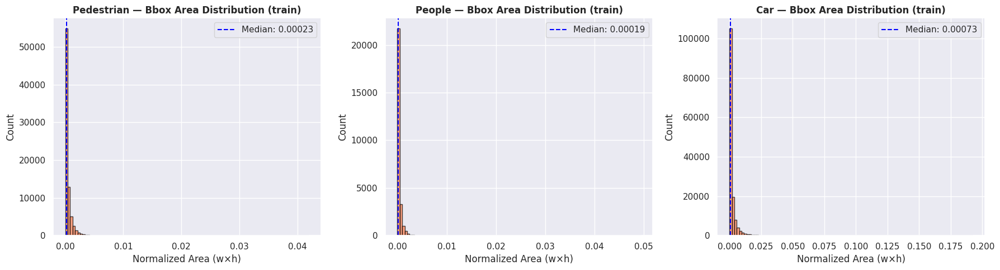

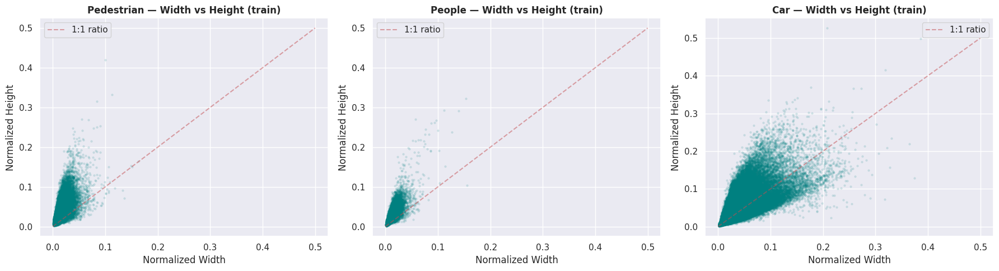

In [15]:
# Overall bbox area stats
print("\nNormalized bbox area stats (area = w * h, range 0-1):")
for split in ['train', 'val', 'test']:
    subset = df[df['split'] == split]
    print(f"\n{split.upper()} — All classes:")
    print(f"  Area — Mean: {subset['bbox_area'].mean():.6f}, Median: {subset['bbox_area'].median():.6f}")
    print(f"  Area — Min: {subset['bbox_area'].min():.8f}, Max: {subset['bbox_area'].max():.6f}")
    print(f"  Width — Mean: {subset['bbox_w'].mean():.4f}, Height — Mean: {subset['bbox_h'].mean():.4f}")

# Size distribution for target classes
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, (cls_name, cls_ids) in enumerate([('Pedestrian', [0]), ('People', [1]), ('Car', [3])]):
    subset = df[(df['split'] == 'train') & (df['class_id'].isin(cls_ids))]
    axes[i].hist(subset['bbox_area'], bins=100, color='coral', edgecolor='black', alpha=0.7)
    axes[i].set_title(f'{cls_name} — Bbox Area Distribution (train)', fontweight='bold')
    axes[i].set_xlabel('Normalized Area (w×h)')
    axes[i].set_ylabel('Count')
    axes[i].axvline(subset['bbox_area'].median(), color='blue', linestyle='--',
                    label=f"Median: {subset['bbox_area'].median():.5f}")
    axes[i].legend()
plt.tight_layout()
plt.show()

# Width vs Height scatter for target classes
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, (cls_name, cls_ids) in enumerate([('Pedestrian', [0]), ('People', [1]), ('Car', [3])]):
    subset = df[(df['split'] == 'train') & (df['class_id'].isin(cls_ids))]
    axes[i].scatter(subset['bbox_w'], subset['bbox_h'], alpha=0.1, s=5, color='teal')
    axes[i].set_title(f'{cls_name} — Width vs Height (train)', fontweight='bold')
    axes[i].set_xlabel('Normalized Width')
    axes[i].set_ylabel('Normalized Height')
    axes[i].plot([0, 0.5], [0, 0.5], 'r--', alpha=0.5, label='1:1 ratio')
    axes[i].legend()
plt.tight_layout()
plt.show()

# **ABSOLUTE PIXEL SIZE ANALYSIS**


📊 SIZE CATEGORY BREAKDOWN (COCO-style, train split):

  Pedestrian (n=79,337):
    Small (<32²):  65,238 (82.2%)
    Medium (32²-96²):  13,793 (17.4%)
    Large (>96²):     306 (0.4%)

  People (n=27,059):
    Small (<32²):  23,510 (86.9%)
    Medium (32²-96²):   3,450 (12.7%)
    Large (>96²):      99 (0.4%)

  Car (n=144,867):
    Small (<32²):  69,847 (48.2%)
    Medium (32²-96²):  63,084 (43.5%)
    Large (>96²):  11,936 (8.2%)


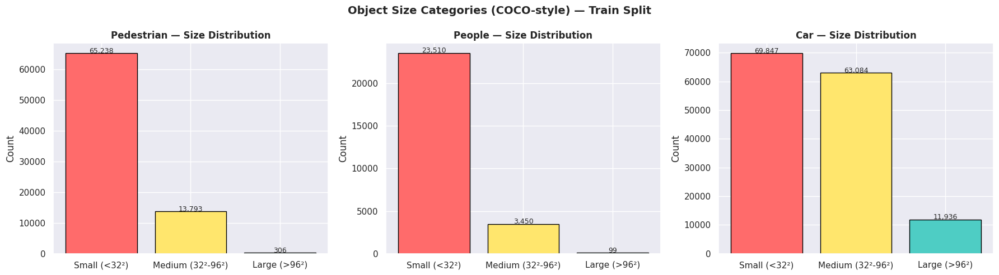


📏 PIXEL DIMENSION STATS (train, target classes):

  Pedestrian:
    Width (px)  — Mean: 16.2, Median: 13.0, Min: 2.0, Max: 273.0
    Height (px) — Mean: 30.7, Median: 25.0, Min: 2.0, Max: 321.0
    Area (px²)  — Mean: 712.3, Median: 315.0

  People:
    Width (px)  — Mean: 16.4, Median: 13.0, Min: 2.0, Max: 215.0
    Height (px) — Mean: 24.7, Median: 20.0, Min: 1.0, Max: 338.0
    Area (px²)  — Mean: 591.6, Median: 273.0

  Car:
    Width (px)  — Mean: 51.3, Median: 38.0, Min: 2.0, Max: 717.0
    Height (px) — Mean: 40.6, Median: 29.0, Min: 0.0, Max: 790.0
    Area (px²)  — Mean: 3289.2, Median: 1104.0


In [18]:
# Merge with resolution data to get pixel sizes
df_merged = df.merge(res_df[['image', 'split', 'width', 'height']],
                     on=['image', 'split'], how='left', suffixes=('', '_img'))

df_merged['bbox_w_px'] = df_merged['bbox_w'] * df_merged['width']
df_merged['bbox_h_px'] = df_merged['bbox_h'] * df_merged['height']
df_merged['bbox_area_px'] = df_merged['bbox_w_px'] * df_merged['bbox_h_px']

# COCO-style size categories
def size_category(area_px):
    if area_px < 32*32:
        return 'Small (<32²)'
    elif area_px < 96*96:
        return 'Medium (32²-96²)'
    else:
        return 'Large (>96²)'

df_merged['size_cat'] = df_merged['bbox_area_px'].apply(size_category)

# Size category breakdown per target class
print("\n📊 SIZE CATEGORY BREAKDOWN (COCO-style, train split):")
train_merged = df_merged[df_merged['split'] == 'train']

for cls_name in ['Pedestrian', 'People', 'Car']:
    subset = train_merged[train_merged['class_name'] == cls_name]
    cats = subset['size_cat'].value_counts()
    total = len(subset)
    print(f"\n  {cls_name} (n={total:,}):")
    for cat in ['Small (<32²)', 'Medium (32²-96²)', 'Large (>96²)']:
        count = cats.get(cat, 0)
        print(f"    {cat}: {count:>7,} ({count/total*100:.1f}%)")

# Visualization
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
cat_order = ['Small (<32²)', 'Medium (32²-96²)', 'Large (>96²)']
cat_colors = ['#FF6B6B', '#FFE66D', '#4ECDC4']

for i, cls_name in enumerate(['Pedestrian', 'People', 'Car']):
    subset = train_merged[train_merged['class_name'] == cls_name]
    cats = subset['size_cat'].value_counts()
    vals = [cats.get(c, 0) for c in cat_order]
    axes[i].bar(cat_order, vals, color=cat_colors, edgecolor='black')
    axes[i].set_title(f'{cls_name} — Size Distribution', fontweight='bold')
    axes[i].set_ylabel('Count')
    for j, v in enumerate(vals):
        axes[i].text(j, v + 50, f'{v:,}', ha='center', fontsize=9)

fig.suptitle('Object Size Categories (COCO-style) — Train Split', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Pixel dimension stats
print("\n📏 PIXEL DIMENSION STATS (train, target classes):")
for cls_name in ['Pedestrian', 'People', 'Car']:
    subset = train_merged[train_merged['class_name'] == cls_name]
    print(f"\n  {cls_name}:")
    print(f"    Width (px)  — Mean: {subset['bbox_w_px'].mean():.1f}, Median: {subset['bbox_w_px'].median():.1f}, Min: {subset['bbox_w_px'].min():.1f}, Max: {subset['bbox_w_px'].max():.1f}")
    print(f"    Height (px) — Mean: {subset['bbox_h_px'].mean():.1f}, Median: {subset['bbox_h_px'].median():.1f}, Min: {subset['bbox_h_px'].min():.1f}, Max: {subset['bbox_h_px'].max():.1f}")
    print(f"    Area (px²)  — Mean: {subset['bbox_area_px'].mean():.1f}, Median: {subset['bbox_area_px'].median():.1f}")


# **Aspect Ratio Analysis**

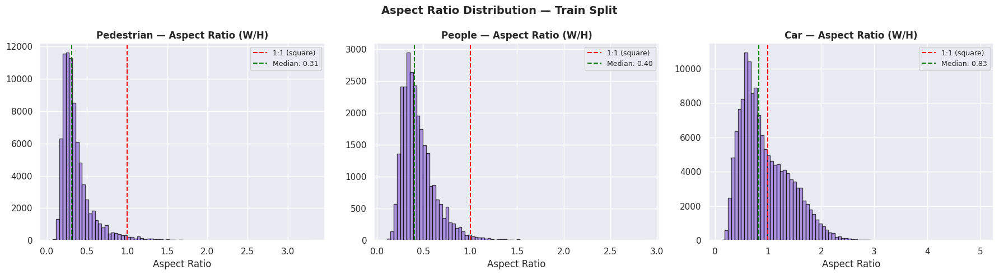


Aspect Ratio Stats (train):
  Pedestrian: Mean=0.37, Median=0.31, Std=0.22
  People: Mean=0.45, Median=0.40, Std=0.19
  Car: Mean=2.92, Median=0.83, Std=750.63


In [19]:
df_merged['aspect_ratio'] = df_merged['bbox_w'] / (df_merged['bbox_h'] + 1e-8)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, cls_name in enumerate(['Pedestrian', 'People', 'Car']):
    subset = df_merged[(df_merged['split'] == 'train') & (df_merged['class_name'] == cls_name)]
    ar = subset['aspect_ratio'].clip(0, 5)  # clip outliers
    axes[i].hist(ar, bins=80, color='mediumpurple', edgecolor='black', alpha=0.7)
    axes[i].set_title(f'{cls_name} — Aspect Ratio (W/H)', fontweight='bold')
    axes[i].set_xlabel('Aspect Ratio')
    axes[i].axvline(1.0, color='red', linestyle='--', label='1:1 (square)')
    axes[i].axvline(ar.median(), color='green', linestyle='--', label=f'Median: {ar.median():.2f}')
    axes[i].legend(fontsize=9)

fig.suptitle('Aspect Ratio Distribution — Train Split', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Aspect ratio stats
print("\nAspect Ratio Stats (train):")
for cls_name in ['Pedestrian', 'People', 'Car']:
    subset = df_merged[(df_merged['split'] == 'train') & (df_merged['class_name'] == cls_name)]
    ar = subset['aspect_ratio']
    print(f"  {cls_name}: Mean={ar.mean():.2f}, Median={ar.median():.2f}, Std={ar.std():.2f}")


# **SPATIAL DISTRIBUTION ANALYSIS**

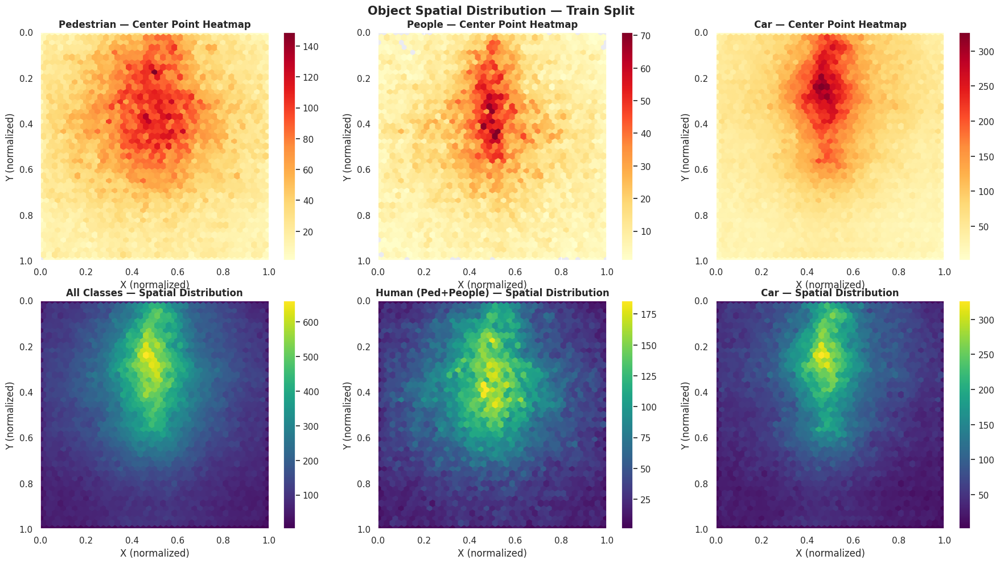

In [20]:
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
target_names = ['Pedestrian', 'People', 'Car']

# Row 1: Center point heatmaps for target classes
for i, cls_name in enumerate(target_names):
    subset = df[(df['split'] == 'train') & (df['class_name'] == cls_name)]
    axes[0][i].hexbin(subset['x_center'], subset['y_center'], gridsize=40,
                       cmap='YlOrRd', mincnt=1)
    axes[0][i].set_title(f'{cls_name} — Center Point Heatmap', fontweight='bold')
    axes[0][i].set_xlabel('X (normalized)')
    axes[0][i].set_ylabel('Y (normalized)')
    axes[0][i].set_xlim(0, 1)
    axes[0][i].set_ylim(1, 0)  # flip y-axis
    axes[0][i].set_aspect('equal')
    plt.colorbar(axes[0][i].collections[0], ax=axes[0][i])

# Row 2: All classes, Human merged, Car
for i, (label, cls_ids) in enumerate([('All Classes', list(range(10))),
                                        ('Human (Ped+People)', [0, 1]),
                                        ('Car', [3])]):
    subset = df[(df['split'] == 'train') & (df['class_id'].isin(cls_ids))]
    axes[1][i].hexbin(subset['x_center'], subset['y_center'], gridsize=40,
                       cmap='viridis', mincnt=1)
    axes[1][i].set_title(f'{label} — Spatial Distribution', fontweight='bold')
    axes[1][i].set_xlabel('X (normalized)')
    axes[1][i].set_ylabel('Y (normalized)')
    axes[1][i].set_xlim(0, 1)
    axes[1][i].set_ylim(1, 0)
    axes[1][i].set_aspect('equal')
    plt.colorbar(axes[1][i].collections[0], ax=axes[1][i])

fig.suptitle('Object Spatial Distribution — Train Split', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

# **Class Co-occurrence Analysis**

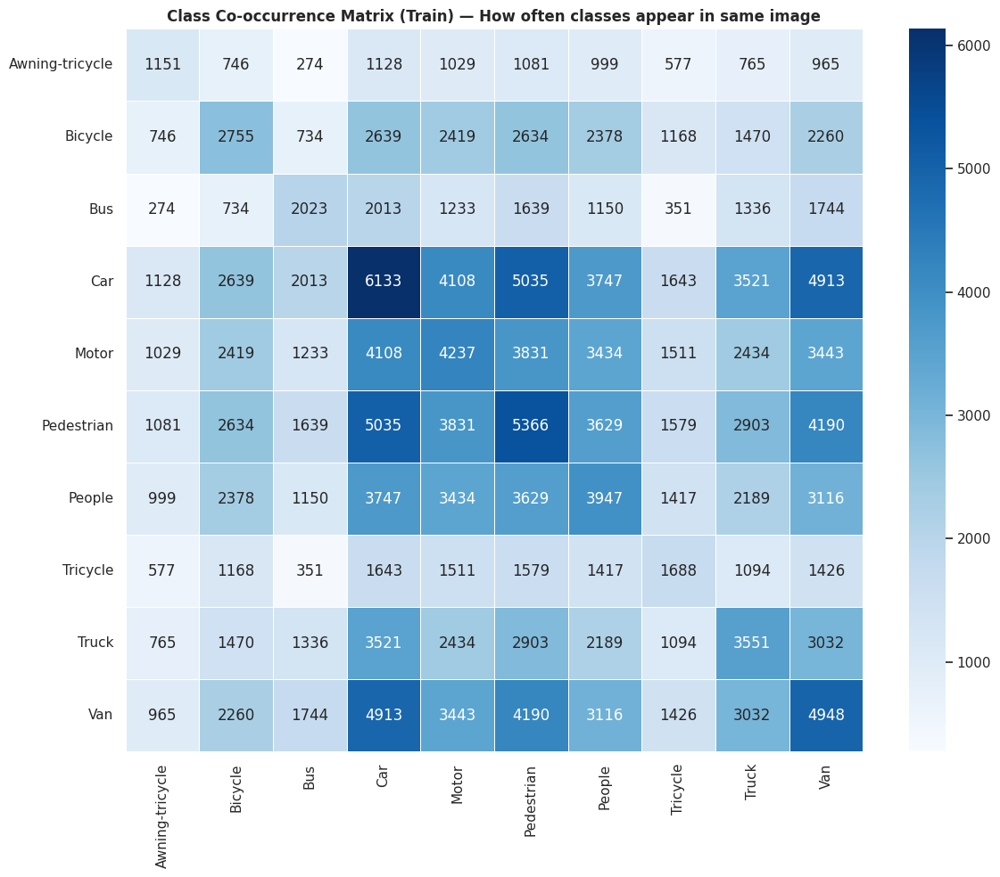


🎯 HUMAN-CAR CO-OCCURRENCE (train images):
  Both Human & Car:   5349 (82.7%)
  Human only:          335 (5.2%)
  Car only:            784 (12.1%)
  Neither:               3 (0.0%)


In [21]:
# Which classes appear together in the same image?
train_df = df[df['split'] == 'train']
img_classes = train_df.groupby('image')['class_name'].apply(set).reset_index()

# Co-occurrence matrix
class_list = sorted(CLASS_NAMES.values())
cooccur = pd.DataFrame(0, index=class_list, columns=class_list)

for _, row in img_classes.iterrows():
    classes = row['class_name']
    for c1 in classes:
        for c2 in classes:
            cooccur.loc[c1, c2] += 1

fig, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(cooccur, annot=True, fmt='d', cmap='Blues', ax=ax, linewidths=0.5)
ax.set_title('Class Co-occurrence Matrix (Train) — How often classes appear in same image', fontweight='bold')
plt.tight_layout()
plt.show()

# Specifically: how often do humans and cars co-exist?
both = 0
human_only = 0
car_only = 0
neither = 0

for _, row in img_classes.iterrows():
    classes = row['class_name']
    has_human = bool(classes & {'Pedestrian', 'People'})
    has_car = 'Car' in classes
    if has_human and has_car:
        both += 1
    elif has_human:
        human_only += 1
    elif has_car:
        car_only += 1
    else:
        neither += 1

total = both + human_only + car_only + neither
print(f"\n🎯 HUMAN-CAR CO-OCCURRENCE (train images):")
print(f"  Both Human & Car:  {both:>5} ({both/total*100:.1f}%)")
print(f"  Human only:        {human_only:>5} ({human_only/total*100:.1f}%)")
print(f"  Car only:          {car_only:>5} ({car_only/total*100:.1f}%)")
print(f"  Neither:           {neither:>5} ({neither/total*100:.1f}%)")

# **Overlap / Crowding Analysis**


Overlap IoU stats (same-class pairs with IoU > 0, sampled):

  Pedestrian (753 overlapping pairs):
    Mean IoU: 0.143, Median: 0.100
    >0.3 IoU: 100 (13.3%)
    >0.5 IoU: 19 (2.5%)

  People (121 overlapping pairs):
    Mean IoU: 0.221, Median: 0.140
    >0.3 IoU: 42 (34.7%)
    >0.5 IoU: 14 (11.6%)

  Car (1831 overlapping pairs):
    Mean IoU: 0.131, Median: 0.091
    >0.3 IoU: 192 (10.5%)
    >0.5 IoU: 38 (2.1%)


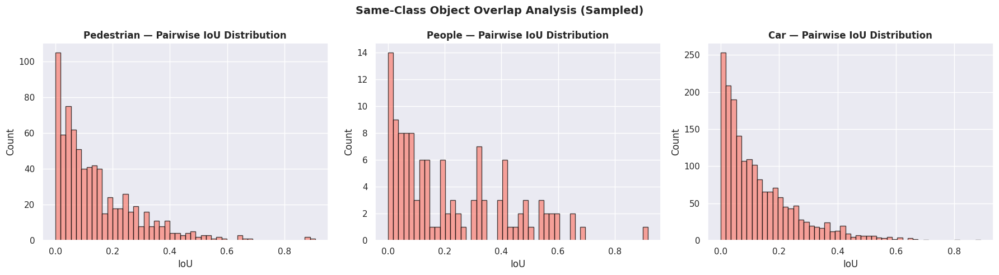

In [22]:
def compute_iou(box1, box2):
    """Compute IoU between two YOLO boxes [x_center, y_center, w, h]."""
    x1_min = box1[0] - box1[2]/2
    y1_min = box1[1] - box1[3]/2
    x1_max = box1[0] + box1[2]/2
    y1_max = box1[1] + box1[3]/2

    x2_min = box2[0] - box2[2]/2
    y2_min = box2[1] - box2[3]/2
    x2_max = box2[0] + box2[2]/2
    y2_max = box2[1] + box2[3]/2

    inter_x = max(0, min(x1_max, x2_max) - max(x1_min, x2_min))
    inter_y = max(0, min(y1_max, y2_max) - max(y1_min, y2_min))
    inter_area = inter_x * inter_y

    area1 = box1[2] * box1[3]
    area2 = box2[2] * box2[3]
    union = area1 + area2 - inter_area

    return inter_area / (union + 1e-8)

# Sample 200 images and compute IoU between same-class objects
np.random.seed(42)
sample_images = np.random.choice(train_df['image'].unique(), min(200, len(train_df['image'].unique())), replace=False)

overlap_stats = {'Pedestrian': [], 'People': [], 'Car': []}

for img_name in sample_images:
    img_df = train_df[train_df['image'] == img_name]
    for cls_name in ['Pedestrian', 'People', 'Car']:
        cls_df = img_df[img_df['class_name'] == cls_name]
        if len(cls_df) < 2:
            continue
        boxes = cls_df[['x_center', 'y_center', 'bbox_w', 'bbox_h']].values
        max_iou = 0
        for i in range(len(boxes)):
            for j in range(i+1, min(len(boxes), i+10)):  # limit pairs for speed
                iou = compute_iou(boxes[i], boxes[j])
                max_iou = max(max_iou, iou)
                if iou > 0:
                    overlap_stats[cls_name].append(iou)

print("\nOverlap IoU stats (same-class pairs with IoU > 0, sampled):")
for cls_name, ious in overlap_stats.items():
    if ious:
        arr = np.array(ious)
        print(f"\n  {cls_name} ({len(arr)} overlapping pairs):")
        print(f"    Mean IoU: {arr.mean():.3f}, Median: {np.median(arr):.3f}")
        print(f"    >0.3 IoU: {(arr > 0.3).sum()} ({(arr > 0.3).sum()/len(arr)*100:.1f}%)")
        print(f"    >0.5 IoU: {(arr > 0.5).sum()} ({(arr > 0.5).sum()/len(arr)*100:.1f}%)")
    else:
        print(f"  {cls_name}: No overlapping pairs found")

# Plot overlap distributions
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, cls_name in enumerate(['Pedestrian', 'People', 'Car']):
    if overlap_stats[cls_name]:
        axes[i].hist(overlap_stats[cls_name], bins=50, color='salmon', edgecolor='black', alpha=0.7)
        axes[i].set_title(f'{cls_name} — Pairwise IoU Distribution', fontweight='bold')
        axes[i].set_xlabel('IoU')
        axes[i].set_ylabel('Count')
    else:
        axes[i].text(0.5, 0.5, 'No overlaps', ha='center', va='center', transform=axes[i].transAxes)
        axes[i].set_title(f'{cls_name}', fontweight='bold')
fig.suptitle('Same-Class Object Overlap Analysis (Sampled)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# **Tiny Object Deep Dive**


Objects below pixel dimension thresholds (train, target classes):

  Pedestrian (n=79,337):
    <  8px: width=21,427 (27.0%), height= 3,851 (4.9%), both= 3,347 (4.2%)
    < 16px: width=49,602 (62.5%), height=18,211 (23.0%), both=17,273 (21.8%)
    < 24px: width=65,276 (82.3%), height=37,005 (46.6%), both=36,080 (45.5%)
    < 32px: width=72,223 (91.0%), height=51,757 (65.2%), both=51,077 (64.4%)
    < 48px: width=76,897 (96.9%), height=67,099 (84.6%), both=66,680 (84.0%)
    < 64px: width=78,367 (98.8%), height=73,875 (93.1%), both=73,627 (92.8%)

  People (n=27,059):
    <  8px: width= 6,128 (22.6%), height= 1,691 (6.2%), both= 1,590 (5.9%)
    < 16px: width=16,167 (59.7%), height= 9,220 (34.1%), both= 8,772 (32.4%)
    < 24px: width=22,266 (82.3%), height=16,571 (61.2%), both=16,173 (59.8%)
    < 32px: width=24,890 (92.0%), height=21,084 (77.9%), both=20,844 (77.0%)
    < 48px: width=26,398 (97.6%), height=25,003 (92.4%), both=24,904 (92.0%)
    < 64px: width=26,789 (99.0%), height=2

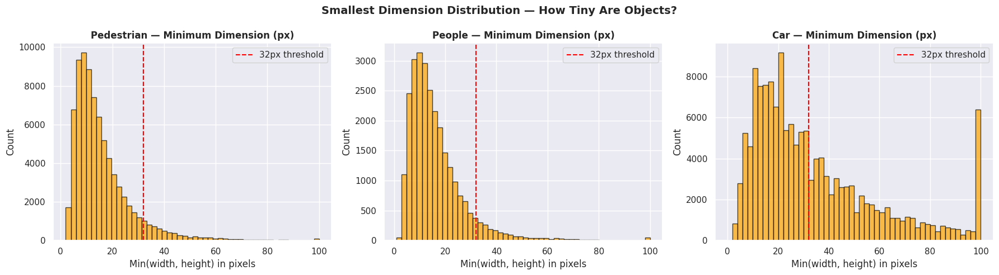

In [23]:
# How many objects are extremely small?
thresholds = [8, 16, 24, 32, 48, 64]

print("\nObjects below pixel dimension thresholds (train, target classes):")
for cls_name in ['Pedestrian', 'People', 'Car']:
    subset = df_merged[(df_merged['split'] == 'train') & (df_merged['class_name'] == cls_name)]
    total = len(subset)
    print(f"\n  {cls_name} (n={total:,}):")
    for t in thresholds:
        tiny_w = (subset['bbox_w_px'] < t).sum()
        tiny_h = (subset['bbox_h_px'] < t).sum()
        tiny_both = ((subset['bbox_w_px'] < t) & (subset['bbox_h_px'] < t)).sum()
        print(f"    < {t:>2}px: width={tiny_w:>6,} ({tiny_w/total*100:.1f}%), "
              f"height={tiny_h:>6,} ({tiny_h/total*100:.1f}%), "
              f"both={tiny_both:>6,} ({tiny_both/total*100:.1f}%)")

# Distribution of smallest objects
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for i, cls_name in enumerate(['Pedestrian', 'People', 'Car']):
    subset = df_merged[(df_merged['split'] == 'train') & (df_merged['class_name'] == cls_name)]
    min_dim = np.minimum(subset['bbox_w_px'], subset['bbox_h_px'])
    axes[i].hist(min_dim.clip(0, 100), bins=50, color='orange', edgecolor='black', alpha=0.7)
    axes[i].set_title(f'{cls_name} — Minimum Dimension (px)', fontweight='bold')
    axes[i].set_xlabel('Min(width, height) in pixels')
    axes[i].set_ylabel('Count')
    axes[i].axvline(32, color='red', linestyle='--', label='32px threshold')
    axes[i].legend()

fig.suptitle('Smallest Dimension Distribution — How Tiny Are Objects?', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# **Train/Val/Test Split Consistency Check**


Class distribution (%) across splits:
class_name  Awning-tricycle  Bicycle   Bus    Car  Motor  Pedestrian  People  Tricycle  Truck   Van
split                                                                                              
test                   0.80     1.73  3.91  37.38   7.78       27.97    8.49      0.71   3.54  7.68
train                  0.95     3.05  1.73  42.21   8.64       23.12    7.88      1.40   3.75  7.27
val                    1.37     3.32  0.65  36.29  12.61       22.82   13.22      2.70   1.94  5.10


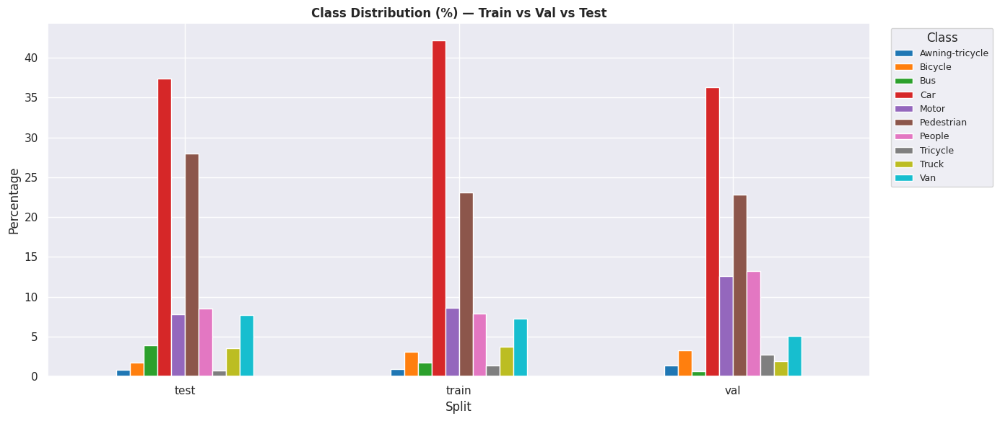


📊 OBJECT DENSITY COMPARISON:

  bbox_area:
    train: mean=0.001535, std=0.003852
    val: mean=0.001536, std=0.004314
    test: mean=0.001340, std=0.004028

  bbox_w:
    train: mean=0.025180, std=0.025863
    val: mean=0.023677, std=0.023646
    test: mean=0.021257, std=0.023134

  bbox_h:
    train: mean=0.037656, std=0.032596
    val: mean=0.042773, std=0.031626
    test: mean=0.037842, std=0.034184


In [24]:
# Compare class distributions across splits
split_dist = df.groupby(['split', 'class_name']).size().unstack(fill_value=0)
split_pct = split_dist.div(split_dist.sum(axis=1), axis=0) * 100

print("\nClass distribution (%) across splits:")
print(split_pct.round(2).to_string())

# Visual comparison
fig, ax = plt.subplots(figsize=(14, 6))
split_pct.plot(kind='bar', ax=ax, colormap='tab10')
ax.set_title('Class Distribution (%) — Train vs Val vs Test', fontweight='bold')
ax.set_ylabel('Percentage')
ax.set_xlabel('Split')
ax.legend(title='Class', bbox_to_anchor=(1.02, 1), loc='upper left', fontsize=9)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Object density comparison
print("\n📊 OBJECT DENSITY COMPARISON:")
for metric in ['bbox_area', 'bbox_w', 'bbox_h']:
    print(f"\n  {metric}:")
    for split in ['train', 'val', 'test']:
        subset = df[df['split'] == split]
        print(f"    {split}: mean={subset[metric].mean():.6f}, std={subset[metric].std():.6f}")


# **Sample Image Visualizations with Annotations**

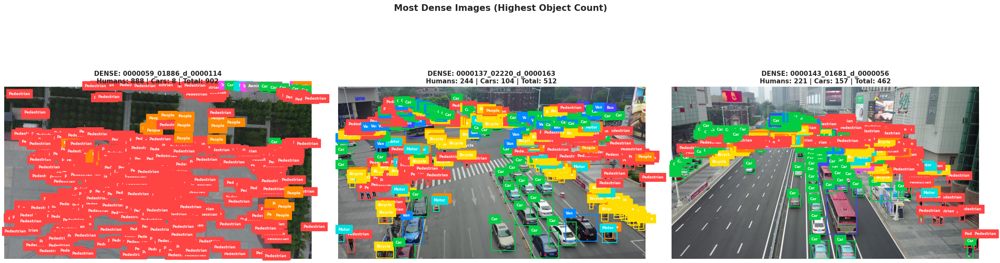

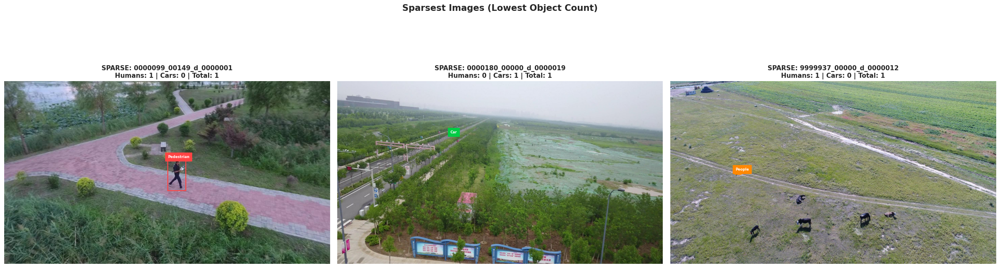

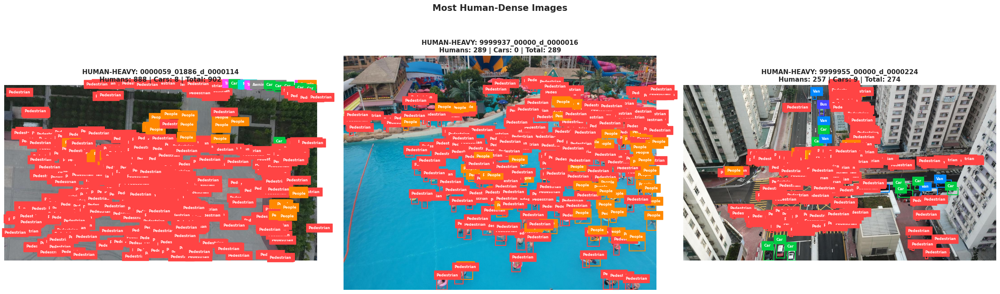

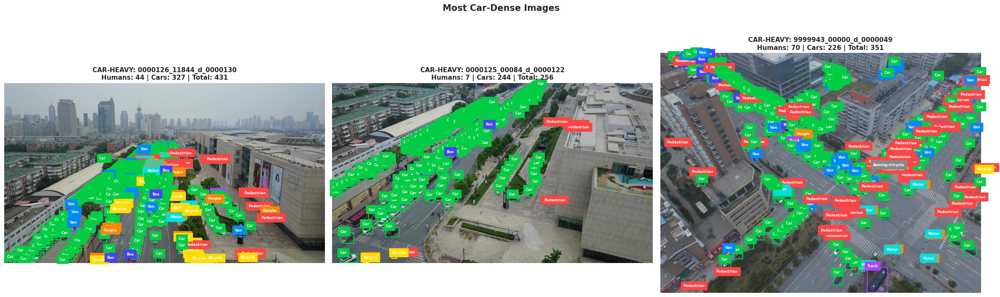

In [27]:
def plot_annotated_image(img_path, labels_df, title="", ax=None):
    """Draw bounding boxes on an image from YOLO labels."""
    img = Image.open(img_path)
    w, h = img.size

    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 8))

    ax.imshow(img)

    color_map = {
        'Pedestrian': '#FF4444', 'People': '#FF8800',
        'Car': '#00CC44', 'Van': '#0088FF', 'Truck': '#AA44FF',
        'Bicycle': '#FFDD00', 'Motor': '#00DDDD',
        'Tricycle': '#FF44FF', 'Awning-tricycle': '#888888', 'Bus': '#4444FF'
    }

    human_count = 0
    car_count = 0

    for _, row in labels_df.iterrows():
        cx, cy = row['x_center'] * w, row['y_center'] * h
        bw, bh = row['bbox_w'] * w, row['bbox_h'] * h
        x1, y1 = cx - bw/2, cy - bh/2

        color = color_map.get(row['class_name'], 'white')
        rect = patches.Rectangle((x1, y1), bw, bh, linewidth=1.5,
                                  edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        ax.text(x1, y1 - 2, row['class_name'], fontsize=6,
                color='white', backgroundcolor=color, fontweight='bold')

        if row['class_name'] in ['Pedestrian', 'People']:
            human_count += 1
        elif row['class_name'] == 'Car':
            car_count += 1

    ax.set_title(f"{title}\nHumans: {human_count} | Cars: {car_count} | Total: {len(labels_df)}",
                 fontweight='bold', fontsize=11)
    ax.axis('off')
    return ax

# Show diverse samples: dense, sparse, human-heavy, car-heavy
train_df = df[df['split'] == 'train']
obj_counts = train_df.groupby('image').size()

# Pick representative images
dense_img = obj_counts.nlargest(5).index.tolist()
sparse_img = obj_counts.nsmallest(5).index.tolist()

human_counts = train_df[train_df['target_group'] == 'Human'].groupby('image').size()
car_counts = train_df[train_df['target_group'] == 'Car'].groupby('image').size()
human_heavy = human_counts.nlargest(5).index.tolist()
car_heavy = car_counts.nlargest(5).index.tolist()

# Plot dense scenes
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
for i, img_name in enumerate(dense_img[:3]):
    img_labels = train_df[train_df['image'] == img_name]
    img_path = img_labels.iloc[0]['img_path']
    plot_annotated_image(img_path, img_labels, f"DENSE: {img_name}", axes[i])
fig.suptitle('Most Dense Images (Highest Object Count)', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

# Plot sparse scenes
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
for i, img_name in enumerate(sparse_img[:3]):
    img_labels = train_df[train_df['image'] == img_name]
    img_path = img_labels.iloc[0]['img_path']
    plot_annotated_image(img_path, img_labels, f"SPARSE: {img_name}", axes[i])
fig.suptitle('Sparsest Images (Lowest Object Count)', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

# Plot human-heavy scenes
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
for i, img_name in enumerate(human_heavy[:3]):
    img_labels = train_df[train_df['image'] == img_name]
    img_path = img_labels.iloc[0]['img_path']
    plot_annotated_image(img_path, img_labels, f"HUMAN-HEAVY: {img_name}", axes[i])
fig.suptitle('Most Human-Dense Images', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

# Plot car-heavy scenes
fig, axes = plt.subplots(1, 3, figsize=(24, 8))
for i, img_name in enumerate(car_heavy[:3]):
    img_labels = train_df[train_df['image'] == img_name]
    img_path = img_labels.iloc[0]['img_path']
    plot_annotated_image(img_path, img_labels, f"CAR-HEAVY: {img_name}", axes[i])
fig.suptitle('Most Car-Dense Images', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

# **Random Samples from Each Split**

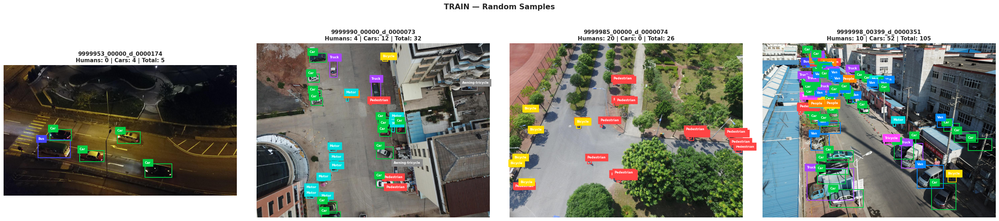

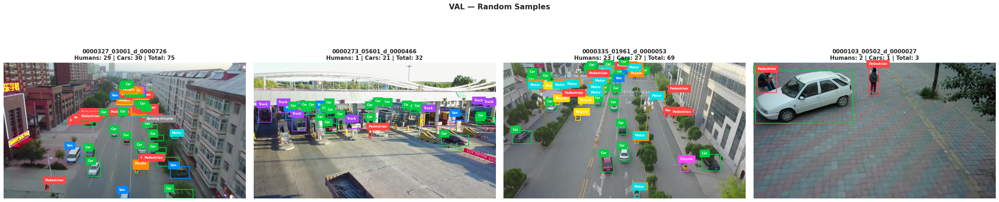

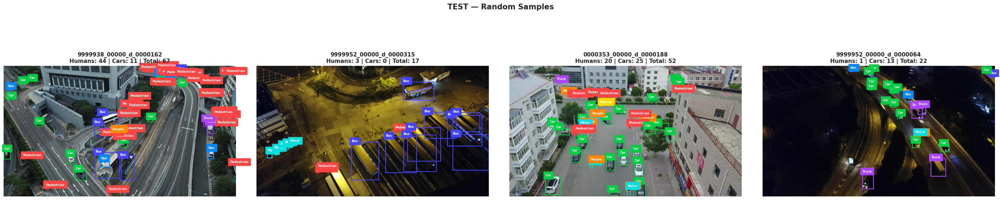

In [28]:
np.random.seed(123)

for split in ['train', 'val', 'test']:
    split_df = df[df['split'] == split]
    sample_imgs = np.random.choice(split_df['image'].unique(), 4, replace=False)

    fig, axes = plt.subplots(1, 4, figsize=(28, 7))
    for i, img_name in enumerate(sample_imgs):
        img_labels = split_df[split_df['image'] == img_name]
        img_path = img_labels.iloc[0]['img_path']
        plot_annotated_image(img_path, img_labels, img_name, axes[i])
    fig.suptitle(f'{split.upper()} — Random Samples', fontsize=15, fontweight='bold')
    plt.tight_layout()
    plt.show()

# **TINY OBJECT ZOOM-IN VISUALIZATION**

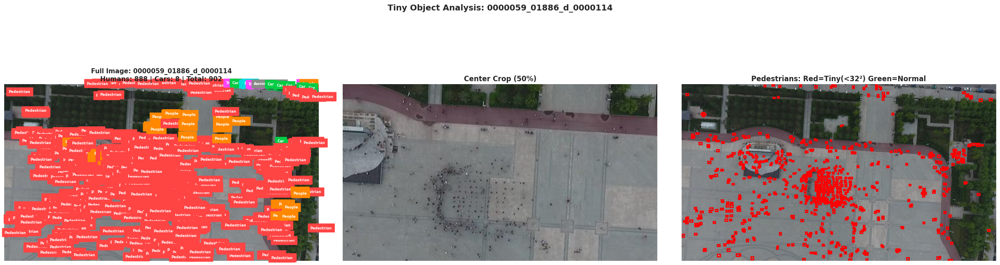

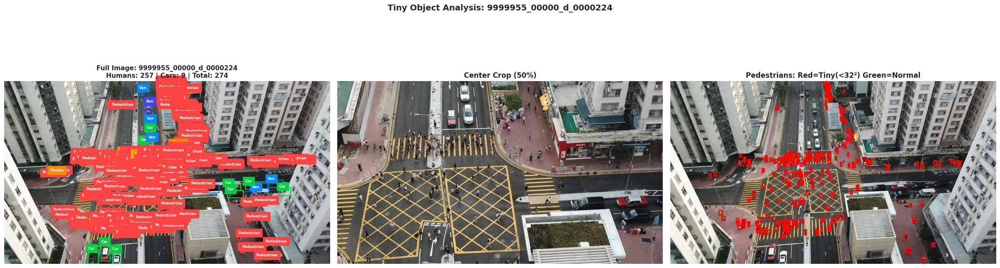

In [29]:
# Find images with many small pedestrians
train_merged_ped = df_merged[(df_merged['split'] == 'train') & (df_merged['class_name'] == 'Pedestrian')]
small_ped_per_img = train_merged_ped[train_merged_ped['bbox_area_px'] < 32*32].groupby('image').size()
tiny_heavy_imgs = small_ped_per_img.nlargest(3).index.tolist()

for img_name in tiny_heavy_imgs[:2]:
    img_labels = train_df[train_df['image'] == img_name]
    img_path = img_labels.iloc[0]['img_path']
    img = Image.open(img_path)
    w, h = img.size

    fig, axes = plt.subplots(1, 3, figsize=(24, 8))

    # Full image
    plot_annotated_image(img_path, img_labels, f"Full Image: {img_name}", axes[0])

    # Crop center region (zoom in)
    crop_x, crop_y = w//4, h//4
    crop_w, crop_h = w//2, h//2
    cropped = img.crop((crop_x, crop_y, crop_x + crop_w, crop_y + crop_h))
    axes[1].imshow(cropped)
    axes[1].set_title('Center Crop (50%)', fontweight='bold')
    axes[1].axis('off')

    # Draw only small pedestrians on full image
    ped_labels = img_labels[img_labels['class_name'] == 'Pedestrian']
    axes[2].imshow(img)
    for _, row in ped_labels.iterrows():
        cx, cy = row['x_center'] * w, row['y_center'] * h
        bw, bh = row['bbox_w'] * w, row['bbox_h'] * h
        x1, y1 = cx - bw/2, cy - bh/2
        color = '#FF0000' if bw * bh < 32*32 else '#00FF00'
        rect = patches.Rectangle((x1, y1), bw, bh, linewidth=2,
                                  edgecolor=color, facecolor='none')
        axes[2].add_patch(rect)
    axes[2].set_title('Pedestrians: Red=Tiny(<32²) Green=Normal', fontweight='bold')
    axes[2].axis('off')

    fig.suptitle(f'Tiny Object Analysis: {img_name}', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# **Annotation Quality Check**

In [30]:
# Check for degenerate boxes
zero_area = df[(df['bbox_w'] <= 0) | (df['bbox_h'] <= 0)]
print(f"\nBoxes with zero/negative width or height: {len(zero_area)}")

# Check for boxes outside image bounds
out_of_bounds = df[
    (df['x_center'] - df['bbox_w']/2 < -0.01) |
    (df['y_center'] - df['bbox_h']/2 < -0.01) |
    (df['x_center'] + df['bbox_w']/2 > 1.01) |
    (df['y_center'] + df['bbox_h']/2 > 1.01)
]
print(f"Boxes extending beyond image bounds: {len(out_of_bounds)}")

# Check for very large boxes (likely annotation errors)
huge_boxes = df[df['bbox_area'] > 0.5]
print(f"Boxes covering >50% of image area: {len(huge_boxes)}")
if len(huge_boxes) > 0:
    print("  Classes:", huge_boxes['class_name'].value_counts().to_dict())

# Check for duplicate annotations
dupes = df.duplicated(subset=['image', 'class_id', 'x_center', 'y_center', 'bbox_w', 'bbox_h'])
print(f"Exact duplicate annotations: {dupes.sum()}")

# Extremely tiny boxes (likely noise)
micro_boxes = df[df['bbox_area'] < 0.000001]
print(f"Micro boxes (area < 1e-6): {len(micro_boxes)}")
if len(micro_boxes) > 0:
    print("  Classes:", micro_boxes['class_name'].value_counts().to_dict())

# Unknown class IDs
unknown = df[~df['class_id'].isin(range(10))]
print(f"Unknown class IDs: {len(unknown)}")
if len(unknown) > 0:
    print("  IDs:", unknown['class_id'].unique())


Boxes with zero/negative width or height: 1
Boxes extending beyond image bounds: 0
Boxes covering >50% of image area: 0
Exact duplicate annotations: 4
Micro boxes (area < 1e-6): 1
  Classes: {'Car': 1}
Unknown class IDs: 0


# **Per-Class Detailed Statistics Table**

In [31]:
train_merged = df_merged[df_merged['split'] == 'train']

stats_rows = []
for cls_id in range(10):
    cls_name = CLASS_NAMES[cls_id]
    subset = train_merged[train_merged['class_id'] == cls_id]
    n = len(subset)
    if n == 0:
        continue
    n_images = subset['image'].nunique()
    small = (subset['bbox_area_px'] < 32*32).sum()
    medium = ((subset['bbox_area_px'] >= 32*32) & (subset['bbox_area_px'] < 96*96)).sum()
    large = (subset['bbox_area_px'] >= 96*96).sum()

    stats_rows.append({
        'Class': cls_name,
        'ID': cls_id,
        'Count': n,
        'Images': n_images,
        'Avg/Img': round(n / n_images, 1),
        'W_px_med': round(subset['bbox_w_px'].median(), 1),
        'H_px_med': round(subset['bbox_h_px'].median(), 1),
        'Area_px_med': round(subset['bbox_area_px'].median(), 1),
        'Small%': round(small / n * 100, 1),
        'Med%': round(medium / n * 100, 1),
        'Large%': round(large / n * 100, 1),
        'Target': '✅' if cls_id in [0, 1, 3] else ''
    })

stats_table = pd.DataFrame(stats_rows)
print(stats_table.to_string(index=False))

          Class  ID  Count  Images  Avg/Img  W_px_med  H_px_med  Area_px_med  Small%  Med%  Large% Target
     Pedestrian   0  79337    5366     14.8      13.0      25.0        315.0    82.2  17.4     0.4      ✅
         People   1  27059    3947      6.9      13.0      20.0        273.0    86.9  12.7     0.4      ✅
        Bicycle   2  10480    2755      3.8      24.0      26.0        612.0    67.8  31.0     1.2       
            Car   3 144867    6133     23.6      38.0      29.0       1104.0    48.2  43.5     8.2      ✅
            Van   4  24956    4948      5.0      40.0      34.0       1352.0    43.1  46.2    10.7       
          Truck   5  12875    3551      3.6      49.0      43.0       2145.0    30.9  52.2    16.8       
       Tricycle   6   4812    1688      2.9      36.0      33.0       1188.0    45.3  50.4     4.4       
Awning-tricycle   7   3246    1151      2.8      36.0      36.0       1320.0    42.1  52.2     5.7       
            Bus   8   5926    2023      2.9   

# **Correlation — Object Count vs Image Resolution**

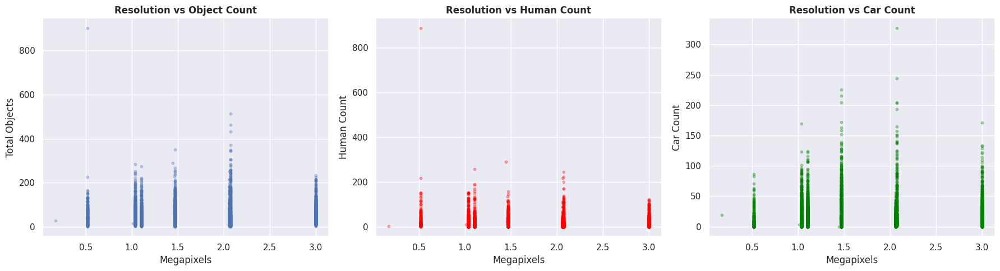

Correlation (megapixels vs objects):  0.082
Correlation (megapixels vs humans):   -0.007
Correlation (megapixels vs cars):     0.098


In [32]:
img_stats = train_merged.groupby('image').agg(
    num_objects=('class_id', 'count'),
    num_humans=('target_group', lambda x: (x == 'Human').sum()),
    num_cars=('target_group', lambda x: (x == 'Car').sum()),
    img_width=('width', 'first'),
    img_height=('height', 'first'),
    megapixels=('width', lambda x: (x.iloc[0] * train_merged.loc[x.index[0], 'height']) / 1e6),
).reset_index()

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].scatter(img_stats['megapixels'], img_stats['num_objects'], alpha=0.3, s=10)
axes[0].set_xlabel('Megapixels')
axes[0].set_ylabel('Total Objects')
axes[0].set_title('Resolution vs Object Count', fontweight='bold')

axes[1].scatter(img_stats['megapixels'], img_stats['num_humans'], alpha=0.3, s=10, color='red')
axes[1].set_xlabel('Megapixels')
axes[1].set_ylabel('Human Count')
axes[1].set_title('Resolution vs Human Count', fontweight='bold')

axes[2].scatter(img_stats['megapixels'], img_stats['num_cars'], alpha=0.3, s=10, color='green')
axes[2].set_xlabel('Megapixels')
axes[2].set_ylabel('Car Count')
axes[2].set_title('Resolution vs Car Count', fontweight='bold')

plt.tight_layout()
plt.show()

# Correlation values
corr1 = img_stats[['megapixels', 'num_objects']].corr().iloc[0, 1]
corr2 = img_stats[['megapixels', 'num_humans']].corr().iloc[0, 1]
corr3 = img_stats[['megapixels', 'num_cars']].corr().iloc[0, 1]
print(f"Correlation (megapixels vs objects):  {corr1:.3f}")
print(f"Correlation (megapixels vs humans):   {corr2:.3f}")
print(f"Correlation (megapixels vs cars):     {corr3:.3f}")

# **OBJECT DISTRIBUTION BY IMAGE REGION**

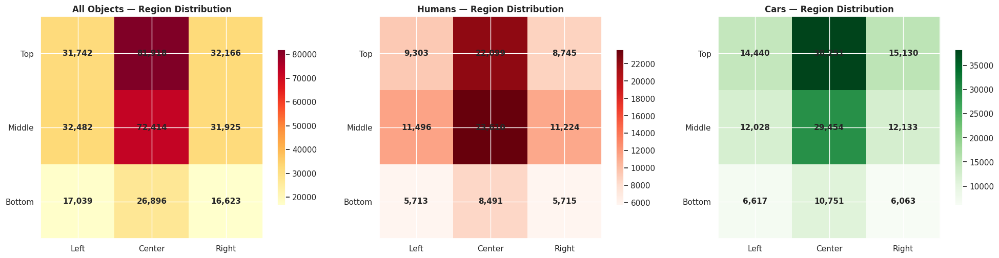

In [33]:
# Divide image into 3x3 grid and count objects per region
def get_region(x, y):
    col = 'Left' if x < 0.33 else ('Center' if x < 0.66 else 'Right')
    row = 'Top' if y < 0.33 else ('Middle' if y < 0.66 else 'Bottom')
    return f"{row}-{col}"

train_only = df[df['split'] == 'train'].copy()
train_only['region'] = train_only.apply(lambda r: get_region(r['x_center'], r['y_center']), axis=1)

# Overall region distribution
region_counts = train_only['region'].value_counts()
region_order = ['Top-Left', 'Top-Center', 'Top-Right',
                'Middle-Left', 'Middle-Center', 'Middle-Right',
                'Bottom-Left', 'Bottom-Center', 'Bottom-Right']

grid = np.zeros((3, 3))
for r_idx, row in enumerate(['Top', 'Middle', 'Bottom']):
    for c_idx, col in enumerate(['Left', 'Center', 'Right']):
        key = f"{row}-{col}"
        grid[r_idx, c_idx] = region_counts.get(key, 0)

fig, axes = plt.subplots(1, 3, figsize=(20, 5))

# All objects
im = axes[0].imshow(grid, cmap='YlOrRd', aspect='equal')
for r in range(3):
    for c in range(3):
        axes[0].text(c, r, f'{int(grid[r,c]):,}', ha='center', va='center', fontsize=11, fontweight='bold')
axes[0].set_title('All Objects — Region Distribution', fontweight='bold')
axes[0].set_xticks([0,1,2]); axes[0].set_xticklabels(['Left','Center','Right'])
axes[0].set_yticks([0,1,2]); axes[0].set_yticklabels(['Top','Middle','Bottom'])
plt.colorbar(im, ax=axes[0], shrink=0.7)

# Humans
human_regions = train_only[train_only['target_group'] == 'Human']['region'].value_counts()
grid_h = np.zeros((3, 3))
for r_idx, row in enumerate(['Top', 'Middle', 'Bottom']):
    for c_idx, col in enumerate(['Left', 'Center', 'Right']):
        grid_h[r_idx, c_idx] = human_regions.get(f"{row}-{col}", 0)

im2 = axes[1].imshow(grid_h, cmap='Reds', aspect='equal')
for r in range(3):
    for c in range(3):
        axes[1].text(c, r, f'{int(grid_h[r,c]):,}', ha='center', va='center', fontsize=11, fontweight='bold')
axes[1].set_title('Humans — Region Distribution', fontweight='bold')
axes[1].set_xticks([0,1,2]); axes[1].set_xticklabels(['Left','Center','Right'])
axes[1].set_yticks([0,1,2]); axes[1].set_yticklabels(['Top','Middle','Bottom'])
plt.colorbar(im2, ax=axes[1], shrink=0.7)

# Cars
car_regions = train_only[train_only['target_group'] == 'Car']['region'].value_counts()
grid_c = np.zeros((3, 3))
for r_idx, row in enumerate(['Top', 'Middle', 'Bottom']):
    for c_idx, col in enumerate(['Left', 'Center', 'Right']):
        grid_c[r_idx, c_idx] = car_regions.get(f"{row}-{col}", 0)

im3 = axes[2].imshow(grid_c, cmap='Greens', aspect='equal')
for r in range(3):
    for c in range(3):
        axes[2].text(c, r, f'{int(grid_c[r,c]):,}', ha='center', va='center', fontsize=11, fontweight='bold')
axes[2].set_title('Cars — Region Distribution', fontweight='bold')
axes[2].set_xticks([0,1,2]); axes[2].set_xticklabels(['Left','Center','Right'])
axes[2].set_yticks([0,1,2]); axes[2].set_yticklabels(['Top','Middle','Bottom'])
plt.colorbar(im3, ax=axes[2], shrink=0.7)

plt.tight_layout()
plt.show()


# **EDA Summary & Key Findings**

In [35]:
total_train = len(df[df['split'] == 'train'])
total_val = len(df[df['split'] == 'val'])
total_test = len(df[df['split'] == 'test'])

target_train = len(df[(df['split'] == 'train') & df['is_target']])
human_train = len(df[(df['split'] == 'train') & (df['target_group'] == 'Human')])
car_train = len(df[(df['split'] == 'train') & (df['target_group'] == 'Car')])

# Small object percentages for target classes
small_stats = {}
for cls_name in ['Pedestrian', 'People', 'Car']:
    subset = df_merged[(df_merged['split'] == 'train') & (df_merged['class_name'] == cls_name)]
    small_pct = (subset['bbox_area_px'] < 32*32).mean() * 100
    small_stats[cls_name] = small_pct

print(f"""
1. DATASET SIZE:
   Train: {total_train:,} annotations | Val: {total_val:,} | Test: {total_test:,}
   Target annotations (train): {target_train:,} ({target_train/total_train*100:.1f}%)
   Humans (train): {human_train:,} | Cars (train): {car_train:,}

2. SMALL OBJECT PROBLEM:
   Pedestrian — {small_stats.get('Pedestrian', 0):.1f}% are SMALL (<32×32 px)
   People     — {small_stats.get('People', 0):.1f}% are SMALL
   Car        — {small_stats.get('Car', 0):.1f}% are SMALL
   → This is the #1 challenge for this dataset

3. CLASS IMBALANCE:
   Car is the dominant target class
   Pedestrian >> People in most splits
   Consider merging Pedestrian + People → "Human"

4. OBJECT DENSITY:
   Some images have 200+ objects — very crowded scenes
   Average objects per image varies significantly

5. KEY DECISIONS NEEDED (share results to discuss):
   a) Merge Pedestrian + People into "Human"?
   b) Training resolution: 640 vs 800 vs 1280?
   c) Include non-target classes or filter to 3 only?
   d) Handle tiny objects: SAHI, higher res, or both?
   e) Any annotation quality issues to address?
""")